In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import roc_auc_score, roc_curve, auc
from lightgbm import LGBMClassifier, early_stopping, log_evaluation
import warnings, gc

In [2]:
train = pd.read_csv('/Users/naveenmsu/Desktop/Competition/DSU Competition Development Data.csv')
test = pd.read_csv('/Users/naveenmsu/Desktop/Competition/DSU Competition Out-Of-Time Data.csv')

In [4]:
cat_cols = [x for x in train.columns if train[x].dtype == object]

/Users/naveenmsu/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



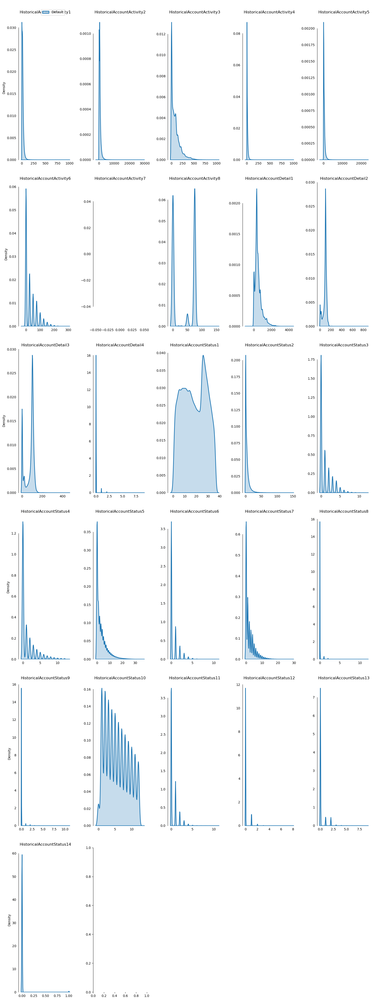

In [5]:
pal, color=['#016CC9','#DEB078'], ['#8DBAE2','#EDD3B3']
cols=[col for col in train.columns if (col.startswith(('H'))) & (col not in cat_cols[:-1])]
plot_df=train[cols]
fig, ax = plt.subplots(6,5, figsize=(16,54))
row=0
col=[0,1,2,3,4]*6
for i, column in enumerate(plot_df.columns[:-1]):
    if (i!=0)&(i%5==0):
        row+=1
    sns.kdeplot(x=column, palette=pal[::-1], hue_order=[1,0], 
                label=['Default','Not Default'], data=plot_df, 
                fill=True, linewidth=2, legend=False, ax=ax[row,col[i]])
    ax[row,col[i]].tick_params(left=False,bottom=False)
    ax[row,col[i]].set(title='\n\n{}'.format(column), xlabel='', ylabel=('Density' if i%5==0 else ''))
for i in range(2,5):
    ax[5,i].set_visible(False)
handles, _ = ax[0,0].get_legend_handles_labels() 
fig.legend(labels=['Default','Not Default'], handles=reversed(handles), ncol=2, bbox_to_anchor=(0.18, 0.983))
sns.despine(bottom=True, trim=True)
plt.tight_layout(rect=[0, 0.2, 1, 0.99])

/var/folders/pl/xqlcfhp16mx__n265hhwsrl00000gn/T/ipykernel_3682/3454807579.py:11: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



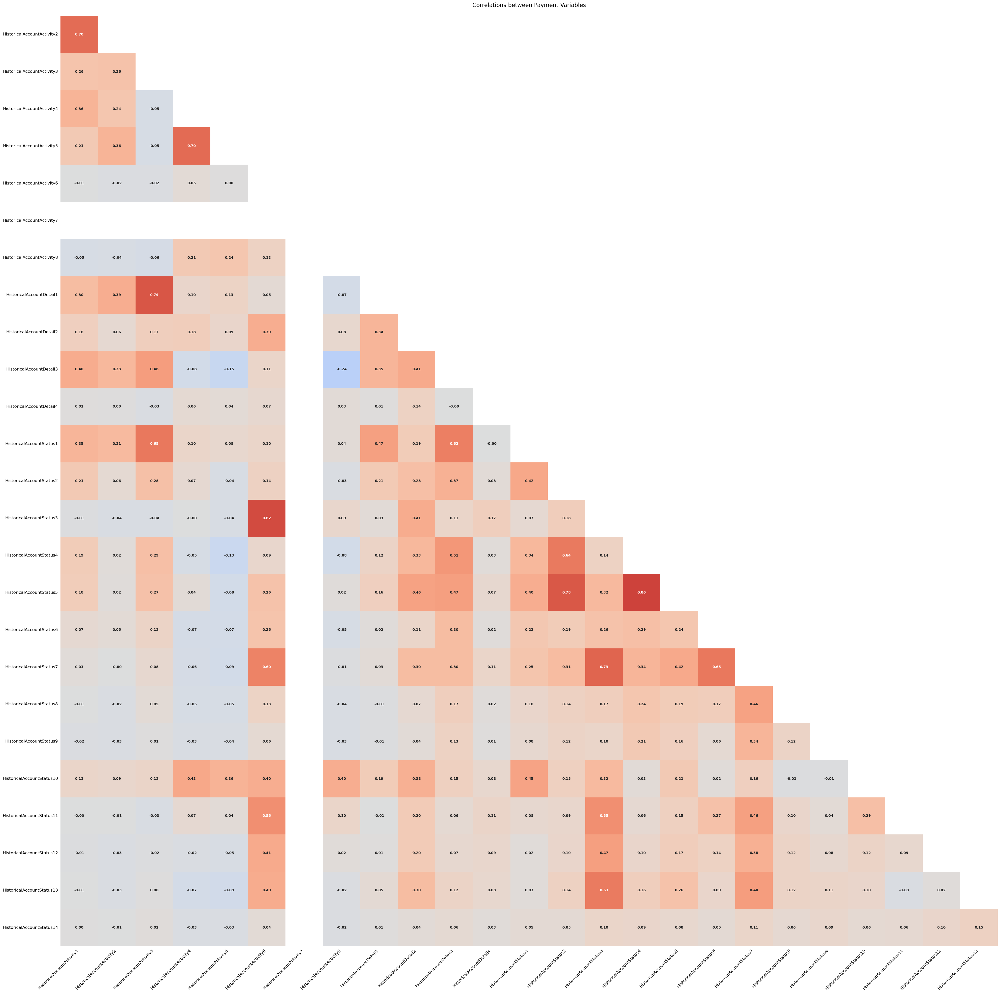

In [6]:
corr=plot_df.iloc[:,:-1].corr()
mask=np.triu(np.ones_like(corr, dtype=bool))[1:,:-1]
corr=corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(48,48))   
sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, center=0, annot=True, fmt='.2f', 
            cmap='coolwarm', annot_kws={'fontsize':10,'fontweight':'bold'}, cbar=False)
ax.tick_params(left=False,bottom=False)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right',fontsize=12)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=12)
plt.title('Correlations between Payment Variables\n', fontsize=16)
fig.show()

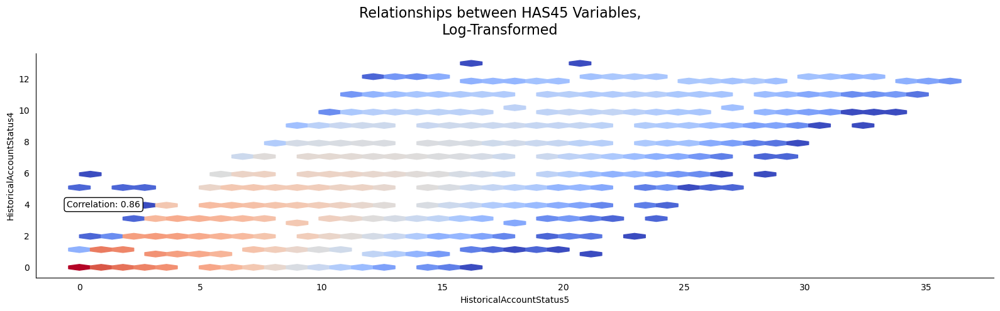

In [7]:
fig, ax = plt.subplots(1,1, figsize=(16,5))
fig.suptitle('Relationships between HAS45 Variables,\nLog-Transformed',fontsize=16)
ax.hexbin(x='HistoricalAccountStatus5', y='HistoricalAccountStatus4', data=plot_df, bins='log', gridsize=40, cmap='coolwarm')
ax.set(xlabel='HistoricalAccountStatus5',ylabel='HistoricalAccountStatus4')
ax.text(1, 4, 'Correlation: {:.2f}'.format(plot_df[['HistoricalAccountStatus5','HistoricalAccountStatus4']].corr().iloc[1,0]), 
           ha="center", va="center",bbox=dict(boxstyle="round,pad=0.3",fc="white"))
ax.tick_params(left=False,bottom=False)
sns.despine()
plt.tight_layout(rect=[0, 0, 1, 0.99])
plt.show()

In [8]:
corr=train.corr()
corr=corr['Target'].sort_values(ascending=False)[1:-1]
pal=sns.color_palette("Reds_r",135).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig = go.Figure()
fig.add_trace(go.Bar(x=corr[corr>=0], y=corr[corr>=0].index, 
                     marker_color=rgb, orientation='h', 
                     marker_line=dict(color=pal,width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))
pal=sns.color_palette("Blues",100).as_hex()
rgb=['rgba'+str(matplotlib.colors.to_rgba(i,0.7)) for i in pal]
fig.add_trace(go.Bar(x=corr[corr<0], y=corr[corr<0].index, 
                     marker_color=rgb[25:], orientation='h', 
                     marker_line=dict(color=pal[25:],width=2), name='',
                     hovertemplate='%{y} correlation with target: %{x:.3f}',
                     showlegend=False))
fig.update_layout(title="Feature Correlations with Target",
                  xaxis_title="Correlation", margin=dict(l=150),
                  height=3000, width=700, hovermode='closest')
fig.show()

In [9]:
null=round((train.isna().sum()/train.shape[0]*100),2).sort_values(ascending=False).astype(str)+('%')
null=null.to_frame().rename(columns={0:'Missing %'})
null.head(30)

,Missing %
PrevAccountStatus1,95.81%
AccountStatus1,66.73%
PrevAccountDetail1,58.9%
AccountDetail6,47.46%
AccountStatus2,35.57%
PrevAccountStatus2,31.67%
AccountDetail5,5.19%
Payment1,4.72%
PrevBalance1,4.72%
Balance2,4.72%


In [10]:
def amex_metric(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:

    def top_four_percent_captured(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        four_pct_cutoff = int(0.04 * df['weight'].sum())
        df['weight_cumsum'] = df['weight'].cumsum()
        df_cutoff = df.loc[df['weight_cumsum'] <= four_pct_cutoff]
        return (df_cutoff['target'] == 1).sum() / (df['target'] == 1).sum()
        
    def weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        df = (pd.concat([y_true, y_pred], axis='columns')
              .sort_values('prediction', ascending=False))
        df['weight'] = df['target'].apply(lambda x: 20 if x==0 else 1)
        df['random'] = (df['weight'] / df['weight'].sum()).cumsum()
        total_pos = (df['target'] * df['weight']).sum()
        df['cum_pos_found'] = (df['target'] * df['weight']).cumsum()
        df['lorentz'] = df['cum_pos_found'] / total_pos
        df['gini'] = (df['lorentz'] - df['random']) * df['weight']
        return df['gini'].sum()

    def normalized_weighted_gini(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:
        y_true_pred = y_true.rename(columns={'target': 'prediction'})
        return weighted_gini(y_true, y_pred) / weighted_gini(y_true, y_true_pred)

    g = normalized_weighted_gini(y_true, y_pred)
    d = top_four_percent_captured(y_true, y_pred)

    return 0.5 * (g + d)


def plot_roc(y_val,y_prob):
    colors=px.colors.qualitative.Prism
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=np.linspace(0,1,11), y=np.linspace(0,1,11), 
                             name='Random Chance',mode='lines', showlegend=False,
                             line=dict(color="Black", width=1, dash="dot")))
    for i in range(len(y_val)):
        y=y_val[i]
        prob=y_prob[i]
        fpr, tpr, _ = roc_curve(y, prob)
        roc_auc = auc(fpr,tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, line=dict(color=colors[::-1][i+1], width=3), 
                                 hovertemplate = 'True positive rate = %{y:.3f}<br>False positive rate = %{x:.3f}',
                                 name='Fold {}:  Gini = {:.3f}, AUC = {:.3f}'.format(i+1, gini[i],roc_auc)))
    fig.update_layout(title="Cross-Validation ROC Curves", 
                      hovermode="x unified", width=700,height=600,
                      xaxis_title='False Positive Rate (1 - Specificity)',
                      yaxis_title='True Positive Rate (Sensitivity)',
                      legend=dict(orientation='v', y=.07, x=1, xanchor="right",
                                  bordercolor="black", borderwidth=.5))
    fig.show()

In [11]:
# Utility function to perform one hot encoding
def encode_and_bind(originaldataframe, featuretoencode):
    originaldataframe[featuretoencode] = originaldataframe[featuretoencode].fillna('Missing')
    dummies = pd.get_dummies(originaldataframe[[featuretoencode]])
    res = pd.concat([originaldataframe, dummies], axis=1)
    #    print(res.columns)
    return(res)

# Main cleaning function
def transform_df(df):
    # Converting to Date datatype and splitting columns
    df['CurrentDate'] = pd.to_datetime(df['CurrentDate'], format = '%m/%d/%Y', errors = 'coerce')
    df['AccountDetail2'] = pd.to_datetime(df['AccountDetail2'], format = '%m/%d/%Y', errors = 'coerce')
    df['AccountStatus2'] = pd.to_datetime(df['AccountStatus2'], format = '%m/%d/%Y', errors = 'coerce')
    df['PrevAccountDetail1'] = pd.to_datetime(df['PrevAccountDetail1'], format = '%m/%d/%Y', errors = 'coerce')  
    df['AccountDetail8'] = pd.to_datetime(df['AccountDetail8'], format = '%m/%d/%Y', errors = 'coerce')
    df['Payment2'] = pd.to_datetime(df['Payment2'], format = '%m/%d/%Y', errors = 'coerce')
    df['Payment4'] = pd.to_datetime(df['Payment4'], format = '%m/%d/%Y', errors = 'coerce')
    
    # Imputing column values
    df['Payment2'].fillna(df['Payment4'])
    df['AccountStatus2'].fillna(df['AccountDetail8'])
    df['PrevAccountDetail1'].fillna(df['AccountDetail2'])
    
    # Splitting to month and year
    df['CurrentDateyear'] = df['CurrentDate'].dt.year
    df['CurrentDatemonth'] = df['CurrentDate'].dt.month
    df['AccountDetail2year'] = df['AccountDetail2'].dt.year
    df['AccountDetail2month'] = df['AccountDetail2'].dt.month
    df['AccountStatus2year'] = df['AccountStatus2'].dt.year
    df['AccountStatus2month'] = df['AccountStatus2'].dt.month
    df['PrevAccountDetail1year'] = df['PrevAccountDetail1'].dt.year
    df['PrevAccountDetail1month'] = df['PrevAccountDetail1'].dt.month
    df['AccountDetail8year'] = df['AccountDetail8'].dt.year
    df['AccountDetail8month'] = df['AccountDetail8'].dt.month
    df['Payment2year'] = df['Payment2'].dt.year
    df['Payment2month'] = df['Payment2'].dt.month
    df['Payment4year'] = df['Payment2'].dt.year
    df['Payment4month'] = df['Payment2'].dt.month
    
    # Label Encoding Columns
    from sklearn.preprocessing import LabelEncoder
    labelencoder = LabelEncoder()
    df['AccountDetail5'].fillna('NaN',inplace=True)
    df['AccountDetail6'].fillna('NaN',inplace=True)
    df['AccountDetail5cat'] = labelencoder.fit_transform(df['AccountDetail5'])
    df['AccountDetail6cat'] = labelencoder.fit_transform(df['AccountDetail6'])
    
    # Dropping Unnecessary columns
    df.drop(['CurrentDate','AccountDetail2',
             'AccountStatus2', 'PrevAccountDetail1',
             'AccountDetail8','Payment2','Payment4',
             'AccountDetail5',
             'AccountDetail6',
             'UniqueID'],axis=1,inplace=True)
    
    
    return df

In [12]:
from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
for col in ['AccountStatus1','PrevAccountStatus1','PrevAccountStatus2']:
    train[col] = enc.fit_transform(train[col])
    test[col] = enc.fit_transform(test[col])
    
train = transform_df(train)
test = transform_df(test)
X=train.drop(['Target'],axis=1)
y=train['Target']
y_valid, gbm_val_probs, gbm_test_preds, gini=[],[],[],[]
ft_importance=pd.DataFrame(index=X.columns)
sk_fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=21)
for fold, (train_idx, val_idx) in enumerate(sk_fold.split(X, y)):
    
    print("\nFold {}".format(fold+1))
    X_train, y_train = X.iloc[train_idx,:], y[train_idx]
    X_val, y_val = X.iloc[val_idx,:], y[val_idx]
    print("Train shape: {}, {}, Valid shape: {}, {}\n".format(
        X_train.shape, y_train.shape, X_val.shape, y_val.shape))
    
    params = {'boosting_type': 'gbdt',
              'n_estimators': 1000,
              'num_leaves': 50,
              'learning_rate': 0.05,
              'colsample_bytree': 0.9,
              'min_child_samples': 2000,
              'max_bins': 500,
              'reg_alpha': 2,
              'objective': 'binary',
              'random_state': 21}
    
    gbm = LGBMClassifier(**params).fit(X_train, y_train, 
                                       eval_set=[(X_train, y_train), (X_val, y_val)],
                                       callbacks=[early_stopping(200), log_evaluation(500)],
                                       eval_metric=['auc','binary_logloss'])
    gbm_prob = gbm.predict_proba(X_val)[:,1]
    gbm_val_probs.append(gbm_prob)
    y_valid.append(y_val)
    
    y_pred=pd.DataFrame(data={'prediction':gbm_prob})
    y_true=pd.DataFrame(data={'target':y_val.reset_index(drop=True)})
    gini_score=amex_metric(y_true = y_true, y_pred = y_pred)
    gini.append(gini_score)
    
    auc_score=roc_auc_score(y_val, gbm_prob)
    gbm_test_preds.append(gbm.predict_proba(test)[:,1])    
    ft_importance["Importance_Fold"+str(fold)]=gbm.feature_importances_    
    print("Validation Gini: {:.5f}, AUC: {:.4f}".format(gini_score,auc_score))
    
    del X_train, y_train, X_val, y_val
    _ = gc.collect()
    
del X, y
plot_roc(y_valid, gbm_val_probs)


Fold 1
Train shape: (270000, 62), (270000,), Valid shape: (30000, 62), (30000,)

Training until validation scores don't improve for 200 rounds
[500]	training's auc: 0.848792	training's binary_logloss: 0.473617	valid_1's auc: 0.829459	valid_1's binary_logloss: 0.494116
Early stopping, best iteration is:
[662]	training's auc: 0.853532	training's binary_logloss: 0.467684	valid_1's auc: 0.829791	valid_1's binary_logloss: 0.493725
Validation Gini: 0.52811, AUC: 0.8298

Fold 2
Train shape: (270000, 62), (270000,), Valid shape: (30000, 62), (30000,)

Training until validation scores don't improve for 200 rounds
[500]	training's auc: 0.848937	training's binary_logloss: 0.47312	valid_1's auc: 0.826934	valid_1's binary_logloss: 0.499757
[1000]	training's auc: 0.862407	training's binary_logloss: 0.456526	valid_1's auc: 0.827945	valid_1's binary_logloss: 0.498745
Did not meet early stopping. Best iteration is:
[1000]	training's auc: 0.862407	training's binary_logloss: 0.456526	valid_1's auc: 0.82

In [13]:
test['Prediction']=np.mean(gbm_test_preds, axis=0)

odf=pd.DataFrame(data={'Target':test['Prediction'].apply(lambda x: 1 if x>0.5 else 0)})
odf=odf.Target.value_counts(normalize=True)
odf.rename(index={1:'Default',0:'Not Default'},inplace=True)
pal, color=['#016CC9','#DEB078'], ['#8DBAE2','#EDD3B3']
fig=go.Figure()
fig.add_trace(go.Pie(labels=odf.index, values=odf*100, hole=.45, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Payment: %{value:.2f}%<extra></extra>"))
fig.update_layout(title='Predicted Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',width=700)
fig.show()

In [23]:
test['Prediction'] = test['Prediction'].apply(lambda x: 1 if x>0.5 else 0)

,AccountActivity1,AccountActivity2,AccountDetail1,AccountDetail3,AccountDetail4,AccountDetail7,AccountStatus1,PrevAccountStatus1,PrevAccountStatus2,AccountActivity3,...,PrevAccountDetail1month,AccountDetail8year,AccountDetail8month,Payment2year,Payment2month,Payment4year,Payment4month,AccountDetail5cat,AccountDetail6cat,Prediction
0,0,0.00,1,1600,0,1100,4,7,2,0.00,...,10.0,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,0
1,0,0.00,1,350,0,0,4,7,2,19.20,...,NaN,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,0
2,0,0.00,1,1250,0,750,4,7,2,6.00,...,7.0,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,0
3,0,0.00,1,350,0,0,4,7,0,0.00,...,NaN,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,0,1
4,0,0.00,1,2000,0,1500,0,7,3,53.33,...,2.0,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299995,0,0.00,1,500,0,0,4,7,3,4.95,...,NaN,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,1
299996,0,0.00,1,3550,0,3050,4,7,0,275.00,...,6.0,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,0
299997,0,6.25,1,350,0,0,4,7,0,6.25,...,NaN,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,1,0
299998,0,0.00,1,1500,0,0,4,7,0,0.00,...,NaN,2018.0,11.0,2018.0,11.0,2018.0,11.0,1,0,0


In [27]:
final_df = pd.read_csv('/Users/naveenmsu/Desktop/Competition/DSU Competition Out-Of-Time Data.csv')
output = final_df[['UniqueID','CurrentDate']]
output['Prediction'] = test['Prediction'].copy()

/var/folders/pl/xqlcfhp16mx__n265hhwsrl00000gn/T/ipykernel_3682/1378227129.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [30]:
# output.to_csv('TabWeau.csv', index=False)
output.head()

,UniqueID,CurrentDate,Prediction
0,32958481,11/1/2018,0
1,33899630,11/1/2018,0
2,28273111,11/1/2018,0
3,34486080,11/1/2018,1
4,31963197,11/1/2018,0
